In [1]:
!nvidia-smi

Tue Nov 19 03:47:46 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   37C    P8               8W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
!pip install -Uqqq pip --progress-bar off
!pip install -qqq git+https://github.com/huggingface/diffusers.git@d8a16635f47ac455abd61879bcc6be32dfeaa561
!pip install -qqq peft==0.12.0 --progress-bar off

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [3]:
import matplotlib
import matplotlib.pyplot as plt
import torch
from diffusers import FluxPipeline

SEED = 42
GENERATOR = torch.Generator("cpu").manual_seed(SEED)

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

In [2]:
import torch
from huggingface_hub import login
from diffusers import StableDiffusionPipeline
import os

# Empty GPU cache to ensure no leftover memory
torch.cuda.empty_cache()

# Retrieve Hugging Face token from environment variable (Colab secrets)
hf_token = os.environ.get('HF_TOKEN')

# Authenticate with Hugging Face
login(hf_token)

# Load Stable Diffusion v1.4 (if available)
pipe = StableDiffusionPipeline.from_pretrained(
    "CompVis/stable-diffusion-v1-4", torch_dtype=torch.float16
)

# Move the model to GPU (T4, P100, etc.)
pipe.to("cuda")

# Optionally, reduce resolution to save memory if needed
pipe.scheduler.set_timesteps(50)  # Reduces the number of timesteps for faster but lower quality

# Example usage of the model
prompt = "A beautiful landscape at sunset"
image = pipe(prompt).images[0]

# Show or save the image
image.show()


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

(…)kpoints/scheduler_config-checkpoint.json:   0%|          | 0.00/209 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

safety_checker/config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/313 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/551 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

In [3]:
def generate_images(
    prompt: str,
    guidance_scale: float = 3.5,
    n_steps: int = 30,
    lora_scale: float = 1.0,
    n_images: int = 1,
):
    return pipe(
        prompt=prompt,
        width=1024,
        height=768,
        guidance_scale=guidance_scale,
        output_type="pil",
        num_inference_steps=n_steps,
        max_sequence_length=512,
        num_images_per_prompt=n_images,
        generator=torch.Generator("cpu").manual_seed(SEED),
        joint_attention_kwargs={"scale": lora_scale},
    ).images

In [4]:
prompt = """Create a highly detailed and realistic portrait of a beautiful woman with a warm, inviting smile.
Her expression should convey a subtle, yet captivating sense of allure, with her gaze directed straight at the camera.
Her eyes should sparkle with a mix of charm and confidence, drawing the viewer in.
The background should be blurred, ensuring full focus remains on her expressive face.
"""

In [10]:
import torch
import time

# Define the seed for reproducibility
SEED = 42  # You can change this to any integer

# Record the start time
start_time = time.time()

# Assuming generate_images function is already defined and doesn't use 'generator'
generate_images(prompt, guidance_scale=7.5, n_steps=50, lora_scale=1.0, n_images=1)[0]

# Record the end time and print the execution duration
end_time = time.time()
print(f"Execution time: {end_time - start_time} seconds")


  0%|          | 0/50 [00:00<?, ?it/s]

Execution time: 30.542587518692017 seconds


## Generation Settings

In [11]:
%%time
steps = [5, 10, 15, 20, 25, 30]

images = []
for n_steps in steps:
    images.append(generate_images(prompt, n_steps=n_steps)[0])

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

CPU times: user 1min 3s, sys: 7.06 s, total: 1min 10s
Wall time: 1min 11s


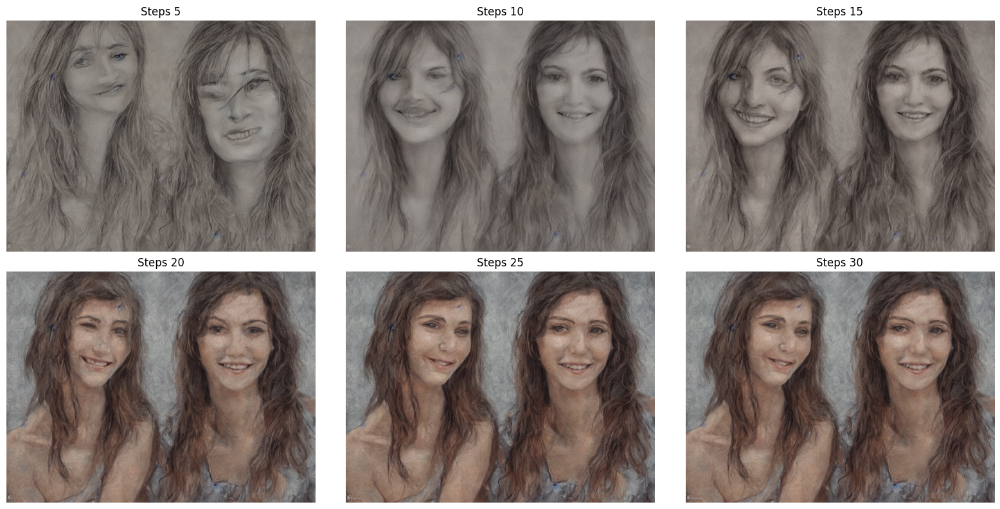

In [13]:
import matplotlib.pyplot as plt

# Your plotting code
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(16, 8))

for ax, img, n_steps in zip(axes.flatten(), images, steps):
    ax.imshow(img)
    ax.axis("off")
    ax.set_title(f"Steps {n_steps}")

plt.tight_layout()


In [14]:
guidances = [0, 2, 4, 6, 8, 10]

In [15]:
%%time

images = []
for guidance in guidances:
    images.append(generate_images(prompt, guidance_scale=guidance)[0])

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

CPU times: user 1min 36s, sys: 10.4 s, total: 1min 47s
Wall time: 1min 48s


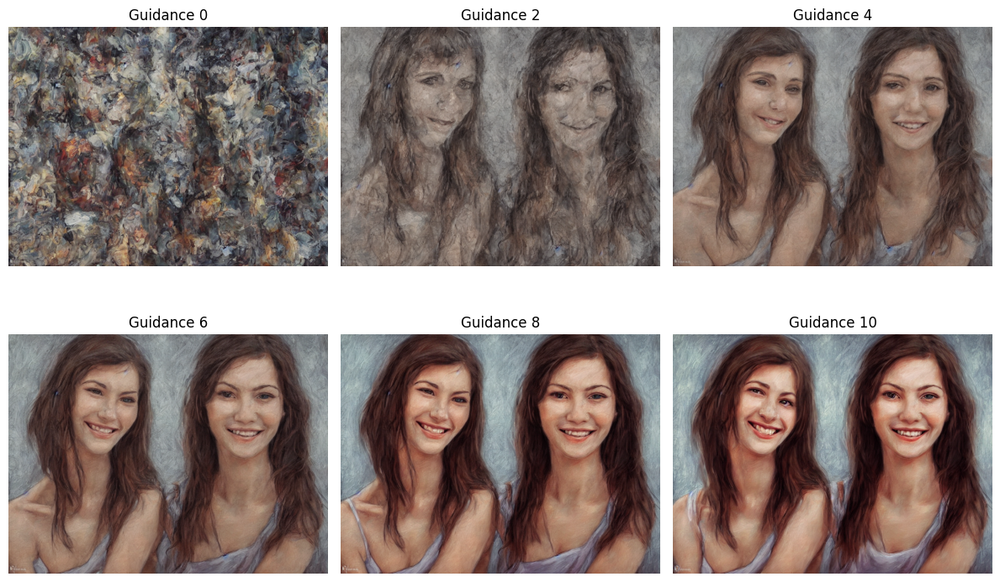

In [16]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(12, 8))

for ax, img, guidance in zip(axes.flatten(), images, guidances):
    ax.imshow(img)
    ax.axis("off")
    ax.set_title(f"Guidance {guidance}")
plt.tight_layout();

## Examples

In [17]:
prompt = """
A mythical, cute, cartoonish hydra with a single, large head, covered in soft purple scales.
The hydra has big, expressive eyes and a wide, friendly smile, exuding a cuddly and approachable demeanor.
The body is chubby and playful, with short, rounded limbs and a small, wagging tail.
The background features a whimsical, enchanted forest.
"""

  0%|          | 0/30 [00:00<?, ?it/s]

CPU times: user 16.8 s, sys: 1.9 s, total: 18.7 s
Wall time: 19 s


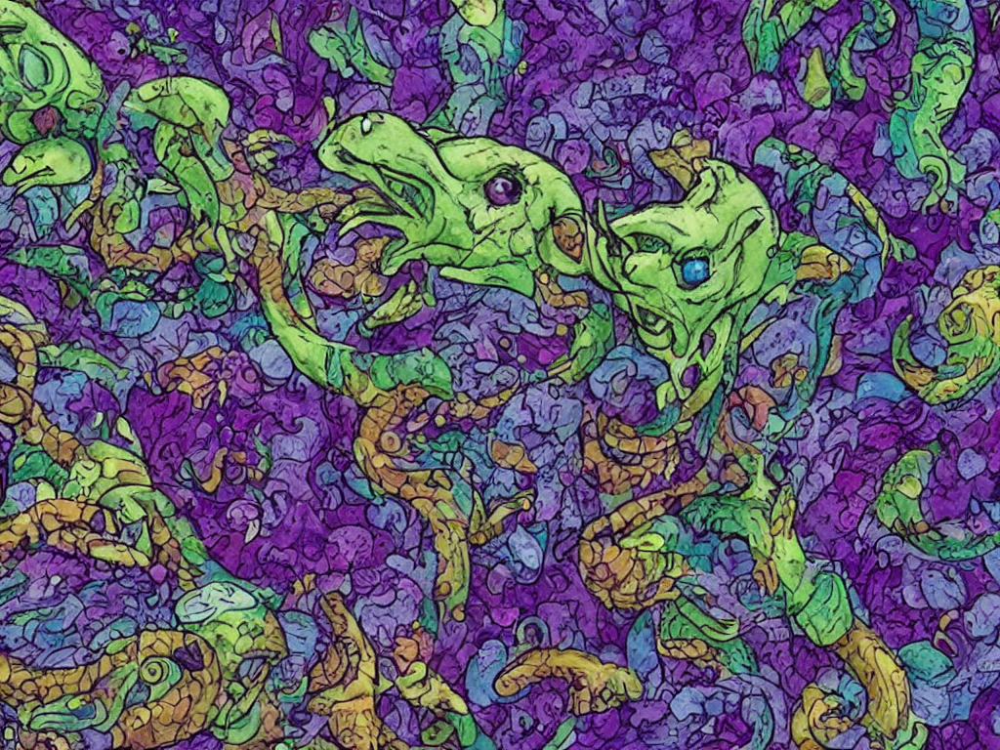

In [18]:
%%time

generate_images(prompt)[0]

## Multiple Images

In [22]:
prompt = """
Two adorable penguins holding hands on a sunny beach.
"""

In [23]:
%%time
images = generate_images(prompt, n_images=4)

  0%|          | 0/30 [00:00<?, ?it/s]

CPU times: user 1min 5s, sys: 11.2 s, total: 1min 17s
Wall time: 1min 17s


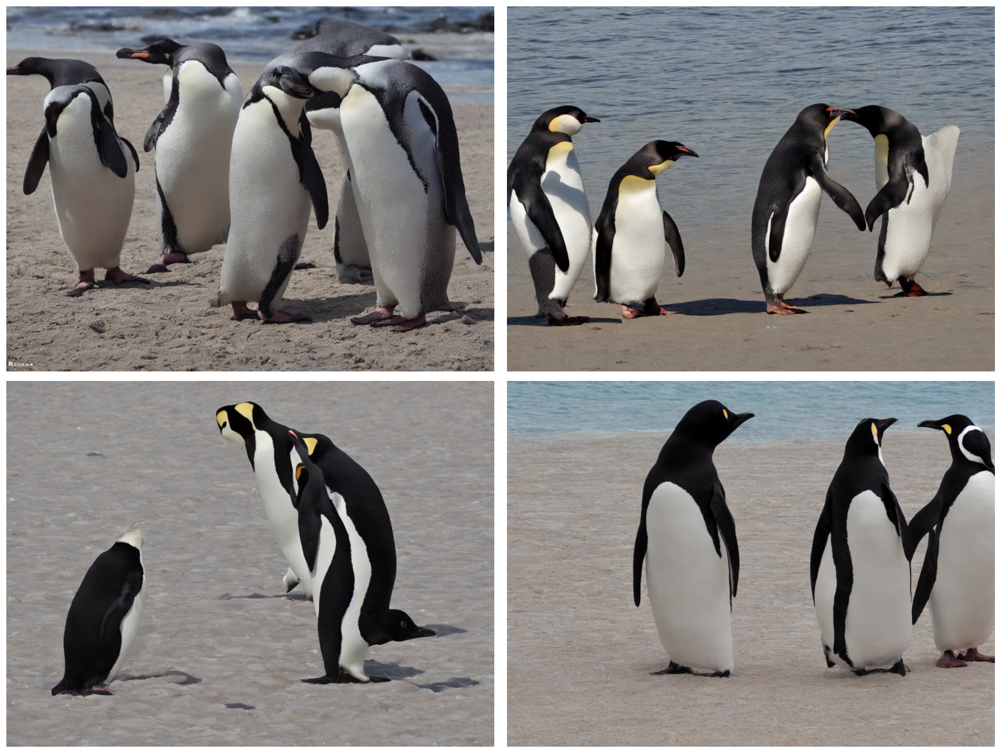

In [24]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 12))

for ax, img in zip(axes.flatten(), images):
    ax.imshow(img)
    ax.axis("off")
plt.tight_layout();

## Using LoRA

In [ ]:
pipe.load_lora_weights(
    pretrained_model_name_or_path_or_dict="D:\ComfyUI_windows_portable\ComfyUI\models\loras\riya.safetensors",
    weight_name="riya.safetensors",
)

In [ ]:
prompt = """Create a highly detailed and realistic portrait of a beautiful woman with a warm, inviting smile.
"""

In [ ]:
%%time

generate_images(prompt)[0]

In [ ]:
prompt = """
A baby blue and turquoise excavator parked at a bustling Slavic street repair site.
The excavator has a friendly, compact design with oversized, rounded features.
The surrounding scene includes cobblestone streets, traditional Slavic architecture with colorful facades,
and construction tools scattered around. The background shows a vibrant urban setting with people and
vintage buildings, adding a lively, authentic touch
"""

In [ ]:
scales = [0.0, 0.25, 0.5, 1.0]

In [ ]:
%%time
images = []

for scale in scales:
    images.append(generate_images(prompt, lora_scale=scale)[0])

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 12))

for ax, img, scale in zip(axes.flatten(), images, scales):
    ax.imshow(img)
    ax.axis("off")
    ax.set_title(f"Lora scale {scale}")
plt.tight_layout();

In [ ]:
prompt = """A stunning modern oceanfront house with sleek architecture and expansive glass windows,
offering a breathtaking view of the sparkling water. The house features clean lines, an open layout, and a spacious deck.
Surrounding it is lush, vibrant greenery with flourishing flora under a bright, sunny sky.
The scene captures a warm, inviting atmosphere with the shimmering ocean in the background.
"""

In [ ]:
%%time
images = generate_images(prompt, n_images=4)

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 12))

for ax, img in zip(axes.flatten(), images):
    ax.imshow(img)
    ax.axis("off")
plt.tight_layout();

In [ ]:
prompt = """A modern bedroom with a minimalistic design featuring white furniture.
The room is bathed in natural sunlight streaming through two large windows, creating a bright, airy atmosphere.
Incorporate subtle blue accents in decorative pillows, a rug, or a piece of wall art to add pops of color.
The space is uncluttered, with sleek lines and an emphasis on functionality.
"""

In [ ]:
%%time
images = generate_images(prompt, n_images=4)

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 12))

for ax, img in zip(axes.flatten(), images):
    ax.imshow(img)
    ax.axis("off")
plt.tight_layout();

In [ ]:
prompt = """A charming baby unicorn avatar for a habit tracker app.
The unicorn is small, with a soft pastel color palette featuring light pink and lavender.
It has a sparkling, multicolored mane and a golden horn, with big, expressive eyes and a friendly smile.
The unicorn’s pose is playful and engaging, perfect for motivating users and adding a touch of magic to their daily tracking.
"""

In [ ]:
%%time
images = generate_images(prompt, guidance_scale=2.0, n_images=4)

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 12))

for ax, img in zip(axes.flatten(), images):
    ax.imshow(img)
    ax.axis("off")
plt.tight_layout();